<a href="https://colab.research.google.com/github/s-c-soma/AdvanceDataMining-CMPE-256/blob/main/project/1_CMPE256_Covid19_VacTweet_PreProcessing_Sentiment_Analysis_(CHIRPS).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Public opinion and sentiment analysis on the COVID-19 vaccine using Twitter data</u></b>

# **Team**: Chirp
# **Team Members**: Ashika Anand Babu, Subarna Chowdhury Soma, Vishnu Vardhan Reddy Yeruva

# Connection With Drive

In [2]:
#cannot share in github right now as the repository is private.
from google.colab import drive
drive.mount('/content/gdrive')


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Change Your Path Here

In [3]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/CMPE256_Project/Data"
# %cd /content/gdrive/My Drive/CMPE256_Project/Data/

## Other

/content/gdrive/My Drive/CMPE256_Project/Data


In [5]:
! kaggle datasets download -d gpreda/all-covid19-vaccines-tweets

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python2.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python2.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 146, in authenticate
    self.config_file, self.config_dir))
IOError: Could not find kaggle.json. Make sure it's located in /content/gdrive/My Drive/CMPE256_Project/Data. Or use the environment method.


In [6]:
!unzip \*.zip  && rm *.zip

unzip:  cannot find or open *.zip, *.zip.zip or *.zip.ZIP.

No zipfiles found.


# Import packages

In [7]:
!pip install neattext
import neattext as ntx

     |████████████████████████████████| 114 kB 28.1 MB/s 


In [8]:
# Import standard libraries
import numpy as np
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm, dates
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import string, collections, unicodedata
import missingno as msno

# Import NLP libraries
import re
import nltk
import json
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('vader_lexicon')
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from wordcloud import WordCloud, STOPWORDS
from nltk.util import ngrams
from nltk.tokenize import word_tokenize
from nltk.corpus import subjectivity
%matplotlib inline 

# Import models, evaluator libraries
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score 
from sklearn.model_selection import train_test_split
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import *
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import plot_confusion_matrix

# Import location, time libraries
import os
import time
from datetime import datetime, timedelta

%matplotlib inline

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


/usr/local/lib/python3.7/dist-packages/nltk/twitter/__init__.py:20: UserWarning:

The twython library has not been installed. Some functionality from the twitter package will not be available.



In [9]:
!pip install langdetect


     |████████████████████████████████| 981 kB 36.0 MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=018483e0dc99b269aa99fbec01bde77797bc05950c91df9d5d5c1f8fc58dbf64
  Stored in directory: /root/.cache/pip/wheels/c5/96/8a/f90c59ed25d75e50a8c10a1b1c2d4c402e4dacfa87f3aff36a
Successfully built langdetect


In [10]:
!pip install geopandas

     |████████████████████████████████| 1.0 MB 31.0 MB/s 
     |████████████████████████████████| 6.3 MB 45.9 MB/s 
     |████████████████████████████████| 15.4 MB 47.2 MB/s 


In [11]:
pip install -U textblob

     |████████████████████████████████| 636 kB 32.4 MB/s 
  Attempting uninstall: textblob
    Found existing installation: textblob 0.15.3
    Uninstalling textblob-0.15.3:
      Successfully uninstalled textblob-0.15.3


In [12]:
#Working with Data/CSV of movies with Panda and Numpy libraries
import pandas as pd
import numpy as np

from pandas import Series, DataFrame
pd.options.mode.chained_assignment = None



In [13]:
from textblob import TextBlob

b = TextBlob('So excited to get my vaccine!')
print(b.sentiment)

Sentiment(polarity=0.46875, subjectivity=0.75)


# Twitter Data: Load Data

* https://www.kaggle.com/gpreda/all-covid19-vaccines-tweets
* https://www.kaggle.com/maxjon/complete-tweet-sentiment-extraction-data


In [14]:
#Reading vaccination_all_tweets CSV and Loading our data frame

df_vacc_tweet = pd.read_csv('./vaccination_all_tweets.csv', lineterminator='\n', parse_dates=True)
df_tweets_training = pd.read_csv('./tweet_dataset.csv')
df_tweets_training.head(3)

,textID,sentiment,author,text,old_text,aux_id,new_sentiment,selected_text
0,1956967341,empty,xoshayzers,i know i was listenin to bad habit earlier a...,@tiffanylue i know i was listenin to bad habi...,p1000000000,NaN,NaN
1,1956967666,sadness,wannamama,Layin n bed with a headache ughhhh...waitin o...,Layin n bed with a headache ughhhh...waitin o...,c811396dc2,negative,headache
2,1956967696,sadness,coolfunky,Funeral ceremony...gloomy friday...,Funeral ceremony...gloomy friday...,9063631ab1,negative,gloomy


In [15]:
df_vacc_tweet.shape

(220844, 16)

In [16]:

df_vacc_tweet.columns

Index(['id', 'user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'retweets', 'favorites',
       'is_retweet\r'],
      dtype='object')

In [17]:
df_vacc_tweet.sort_values(by='retweets', ascending=False)[['text', 'date', 'user_name', 'user_location', 'hashtags', 'favorites', 'retweets']].head(n=10)

,text,date,user_name,user_location,hashtags,favorites,retweets
68358,"RDIF, Laboratorios Richmond launched productio...",2021-04-20 15:30:23,Sputnik V,"Moscow, Russia",['SputnikV'],25724,11288
46053,Why we need Two Doses of mRNA Vaccine 💉 #vacci...,2021-04-01 21:17:51,hotvickkrishna,"Manhattan, NY","['vaccines', 'COVID19', 'Pfizer', 'moderna', '...",19622,7695
54674,We completely reject the false and malicious r...,2021-04-08 15:17:19,BharatBiotech,"Hyderabad, India",NaN,15944,6018
66822,ICMR study shows #COVAXIN neutralises against ...,2021-04-21 06:54:05,ICMR,New Delhi,['COVAXIN'],11995,4851
68306,Argentine Health Minister @carlavizzotti and P...,2021-04-20 19:54:29,Sputnik V,"Moscow, Russia",NaN,15148,4105
76306,#Argentina's actor breaks into a live TV to sh...,2021-05-19 15:01:14,Sputnik V,"Moscow, Russia","['Argentina', 'SputnikV']",14412,2550
17118,"Got my jab. For the curious, it was #Covaxin. ...",2021-03-01 12:29:37,Dr. S. Jaishankar,"New Delhi, India",['Covaxin'],22815,2360
53045,I see it’s going around with signature cropped...,2021-04-12 21:58:27,dawnymock,Fredericton New Brunswick,"['covid', 'vaccine', 'pfizer', 'moderna']",10175,2299
75232,It’s 72 hours since @BharatBiotech announced t...,2021-05-17 05:11:52,B L Santhosh,"New Delhi, India",NaN,7030,2294
7126,New research published in Microbiology &amp; I...,2021-02-10 15:11:23,Robert F. Kennedy Jr,"Los Angles, California",['mRNA'],3090,2247


In [18]:
df_vacc_tweet.sort_values(by=['date', 'favorites'], ascending=[True, False])[['text', 'date', 'user_name', 'user_location', 'hashtags', 'favorites', 'retweets']].head(n=10)

,text,date,user_name,user_location,hashtags,favorites,retweets
44,#FDA authorizes #PfizerBioNTech #coronavirus v...,2020-12-12 11:55:28,Daily News Egypt,Egypt,"['FDA', 'PfizerBioNTech', 'coronavirus']",1,1
43,Trump announces #vaccine rollout 'in less than...,2020-12-12 11:59:10,City A.M.,"London, England",['vaccine'],2,0
42,#CovidVaccine #Pfizer-BioNTech COVID-19 #Pfize...,2020-12-12 12:12:35,mystic,NaN,"['CovidVaccine', 'Pfizer', 'PfizerBioNTech', '...",1,0
41,FACT SHEET FOR RECIPIENTS AND CAREGIVERS\n\n#P...,2020-12-12 12:16:14,KHuntson,USA🇺🇸,"['PfizerBioNTech', 'CovidVaccine']",0,0
40,@mirekR9 @sputnikvaccine @AstraZeneca it's the...,2020-12-12 12:16:27,"Party politics isn't working for anyone, anywhere","Wales, United Kingdom",['PfizerBioNTech'],0,0
39,@mirekR9 @sputnikvaccine @AstraZeneca check ou...,2020-12-12 12:19:40,"Party politics isn't working for anyone, anywhere","Wales, United Kingdom",NaN,0,0
38,FACT SHEET FOR HEALTHCARE PROVIDERS ADMINISTER...,2020-12-12 12:19:56,KHuntson,USA🇺🇸,"['PfizerBioNTech', 'CovidVaccine']",0,0
37,"Ladies and Gentlemen, now we have #CovidVaccin...",2020-12-12 12:20:30,Farooq Anees,"دبي, الامارات العربية المتحدة","['CovidVaccine', 'Pakistan', 'PfizerBioNTech',...",0,0
36,The #FDA finally issues #EUA now comes the pro...,2020-12-12 12:26:34,John Berry,NaN,"['FDA', 'EUA', 'PfizerBioNTech']",0,0
35,An immigrant Muslim couple find the COVID-19 V...,2020-12-12 12:42:31,Shahjhan Malik | #WearAMask,"Nottinghamshire, England","['CovidVaccine', 'PfizerBioNTech', 'Pfizervacc...",37,2


In [19]:
# df_vacc_tweet['polarity'] = df_vacc_tweet['text'].apply(lambda x: TextBlob(x).sentiment.polarity)
# df_vacc_tweet['subjectivity'] = df_vacc_tweet['text'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
df_vacc_tweet.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False\r
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False\r
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False\r
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False\r
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False\r


# Understanding & Preprocessing Data

## Data Info

In [20]:
df_vacc_tweet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220844 entries, 0 to 220843
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   id                220844 non-null  int64 
 1   user_name         220843 non-null  object
 2   user_location     156144 non-null  object
 3   user_description  204756 non-null  object
 4   user_created      220844 non-null  object
 5   user_followers    220844 non-null  int64 
 6   user_friends      220844 non-null  int64 
 7   user_favourites   220844 non-null  int64 
 8   user_verified     220844 non-null  bool  
 9   date              220844 non-null  object
 10  text              220844 non-null  object
 11  hashtags          172469 non-null  object
 12  source            220725 non-null  object
 13  retweets          220844 non-null  int64 
 14  favorites         220844 non-null  int64 
       220844 non-null  object
dtypes: bool(1), int64(6), object(9)
memory usage: 25.5+ MB

In [21]:
df_vacc_tweet.describe()

,id,user_followers,user_friends,user_favourites,retweets,favorites
count,2.208440e+05,2.208440e+05,220844.000000,2.208440e+05,220844.000000,220844.000000
mean,1.405761e+18,9.698201e+04,986.627719,1.205145e+04,2.429271,10.573672
std,2.785311e+16,8.433785e+05,5330.545659,3.892971e+04,44.644301,165.632989
min,1.337728e+18,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000
25%,1.381574e+18,5.600000e+01,26.000000,5.700000e+01,0.000000,0.000000
50%,1.407441e+18,3.330000e+02,229.000000,9.885000e+02,0.000000,0.000000
75%,1.426169e+18,1.527000e+03,793.000000,7.275000e+03,1.000000,2.000000
max,1.458491e+18,1.628317e+07,582461.000000,1.299600e+06,11288.000000,25724.000000


## Missing Data Check

- We can see that there is a lot of missing data in user_location, description,sources

In [22]:
def missing_data(data):
    total = data.isnull().sum()
    percent = (data.isnull().sum()/data.isnull().count()*100)
    tt = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    types = []
    for col in data.columns:
        dtype = str(data[col].dtype)
        types.append(dtype)
    tt['Types'] = types
    return(np.transpose(tt))

In [23]:
missing_data(df_vacc_tweet)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r
Total,0,1,64700,16088,0,0,0,0,0,0,0,48375,119,0,0,0
Percent,0,0.000452808,29.2967,7.28478,0,0,0,0,0,0,0,21.9046,0.0538842,0,0,0
Types,int64,object,object,object,object,int64,int64,int64,bool,object,object,object,object,int64,int64,object


In [24]:
df_vacc_tweet.isna().sum()

id                      0
user_name               1
user_location       64700
user_description    16088
user_created            0
user_followers          0
user_friends            0
user_favourites         0
user_verified           0
date                    0
text                    0
hashtags            48375
source                119
retweets                0
favorites               0
is_retweet\r            0
dtype: int64

## Unique Values

In [25]:
def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()
        uniques.append(unique)
    tt['Uniques'] = uniques
    return(np.transpose(tt))

In [26]:
unique_values(df_vacc_tweet)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r
Total,220844,220843,156144,204756,220844,220844,220844,220844,220844,220844,220844,172469,220725,220844,220844,220844
Uniques,220844,83558,24953,81928,84777,21894,8078,37867,2,214800,219031,58468,369,443,975,1


## Most Frequent Values

In [27]:
def most_frequent_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    items = []
    vals = []
    for col in data.columns:
        itm = data[col].value_counts().index[0]
        val = data[col].value_counts().values[0]
        items.append(itm)
        vals.append(val)
    tt['Most frequent item'] = items
    tt['Frequence'] = vals
    tt['Percent from total'] = np.round(vals / total * 100, 3)
    return(np.transpose(tt))

In [28]:
most_frequent_values(df_vacc_tweet)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r
Total,220844,220843,156144,204756,220844,220844,220844,220844,220844,220844,220844,172469,220725,220844,220844,220844
Most frequent item,1424773548946558977,CoWIN Blore 18-44,"Bengaluru, India",Get instant alerts for Free/Paid slots in BBMP...,2021-06-29 09:33:13,24,0,0,False,2021-06-18 13:13:23,#COVAXIN vaccine approved for children aged 2 ...,"['COVAXIN', 'BBMP']",Twitter for Android,0,0,False\r
Frequence,1,12210,18940,12185,12210,3681,28954,11242,202139,6,18,11113,57084,165595,115438,220844
Percent from total,0,5.529,12.13,5.951,5.529,1.667,13.111,5.09,91.53,0.003,0.008,6.443,25.862,74.983,52.271,100


## Converting date column to date format

In [29]:

df_vacc_tweet['date_new'] = pd.to_datetime(df_vacc_tweet['date']).dt.date  #converting date column to date format
df_vacc_tweet.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r,date_new
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA",Aggregator of Asian American news; scanning di...,2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cyt...,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s ...",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,While the world has been on the wrong side of ...,NaN,Twitter Web App,1,1,False\r,2020-12-13
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBio...,"['coronavirus', 'SputnikV', 'AstraZeneca', 'Pf...",Twitter for Android,0,0,False\r,2020-12-12
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radi...",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're...",NaN,Twitter Web App,446,2129,False\r,2020-12-12
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternati...,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @Bor...,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False\r,2020-12-12


## Dropping Duplicate Tweets

In [30]:
df_vacc_tweet=df_vacc_tweet.drop_duplicates('text')             
df_vacc_tweet.shape

(219031, 17)

In [31]:
df_vacc_tweet.source.value_counts()

Twitter for Android    56921
Twitter Web App        54965
Twitter for iPhone     47219
CowinAlertsBot         11276
cowin_vaccine_app      10203
                       ...  
Injunnie                   1
TubeBuddy                  1
Twidere X App              1
TV6News                    1
SGMattersWeb               1
Name: source, Length: 369, dtype: int64

## Date: Number of days considered

In [32]:
len(df_vacc_tweet['date'].unique())  

213364

In [33]:
df_vacc_tweet.sort_values(by=['date'], ascending=[True]).head(2)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r,date_new
44,1337727767551553536,Daily News Egypt,Egypt,Egypt's Only Daily Independent Newspaper in En...,2009-04-26 07:56:24,278080,116,765,True,2020-12-12 11:55:28,#FDA authorizes #PfizerBioNTech #coronavirus v...,"['FDA', 'PfizerBioNTech', 'coronavirus']",Twitter Web App,1,1,False\r,2020-12-12
43,1337728701820268544,City A.M.,"London, England","London's business newspaper - News, Opinion, a...",2009-06-09 13:53:06,66224,603,771,True,2020-12-12 11:59:10,Trump announces #vaccine rollout 'in less than...,['vaccine'],Twitter Web App,0,2,False\r,2020-12-12


## Dropping Unnecessary Columns- will decide later

In [34]:
# data1 = df_vacc_tweet.drop(columns={"id","user_name","user_description","user_created","user_followers",\
#                    "user_friends","user_favourites","user_verified","hashtags","source","retweets","favorites","is_retweet\r"},inplace=True)
# # dropping unnecessary 

## Set Data Max Width

In [35]:
pd.set_option('display.max_colwidth', 700)
df_vacc_tweet.head()

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r,date_new
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA","Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccination effort we've ev… https://t.co/dlCHrZjkhm",NaN,Twitter Web App,1,1,False\r,2020-12-13
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is created to last 2-4 years… https://t.co/ieYlCKBr8P,"['coronavirus', 'SputnikV', 'AstraZeneca', 'PfizerBioNTech', 'Moderna', 'Covid_19']",Twitter for Android,0,0,False\r,2020-12-12
3,1337855739918835717,Charles Adler,"Vancouver, BC - Canada","Hosting ""CharlesAdlerTonight"" Global News Radio Network. Weeknights 7 Pacific-10 Eastern - Email comments/ideas to charles@charlesadlertonight.ca",2008-09-10 11:28:53,49165,3933,21853,True,2020-12-12 20:23:59,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. (1) You were born i… https://t.co/jqgV18kch4",NaN,Twitter Web App,446,2129,False\r,2020-12-12
4,1337854064604966912,Citizen News Channel,NaN,Citizen News Channel bringing you an alternative news source from citizen journalists that haven't sold out. Real news & real views,2020-04-23 17:58:42,152,580,1473,False,2020-12-12 20:17:19,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #PfizerBioNTech… https://t.co/KxbSRoBEHq,"['whereareallthesickpeople', 'PfizerBioNTech']",Twitter for iPhone,0,0,False\r,2020-12-12


# Visualize Data Distribution

## Visualizing Tweet Platform-wise Distribution 

(array([0, 1, 2, 3, 4, 5]), <a list of 6 Text major ticklabel objects>)

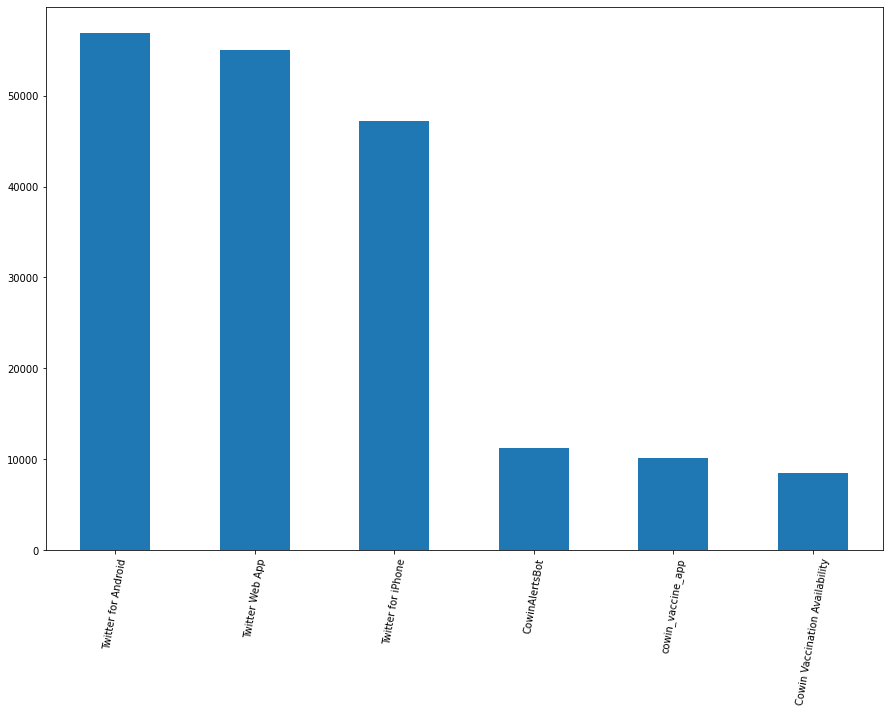

In [36]:

plt.figure(figsize=(15,10))
df_vacc_tweet['source'].value_counts().nlargest(6).plot(kind='bar')
plt.xticks(rotation=80)

## User Name

In [37]:
def plot_count(feature, title, df, size=1, ordered=True):
    f, ax = plt.subplots(1,1, figsize=(4*size,4))
    total = float(len(df))
    if ordered:
        g = sns.countplot(df[feature], order = df[feature].value_counts().index[:20], palette='Set3')
    else:
        g = sns.countplot(df[feature], palette='Set3')
    g.set_title("Number and percentage of {}".format(title))
    if(size > 2):
        plt.xticks(rotation=90, size=8)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height,
                '{:1.2f}%'.format(100*height/total),
                ha="center") 
    plt.show()  

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 129417 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 127757 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 127800 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 27784 missing from current font.

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning:

Glyph 35799 missing from current font.

/usr/local/li

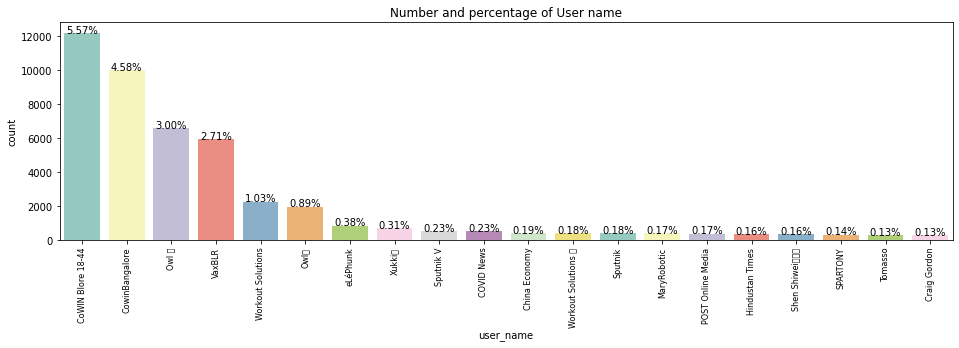

In [38]:
plot_count("user_name", "User name", df_vacc_tweet,4)

## User Location

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



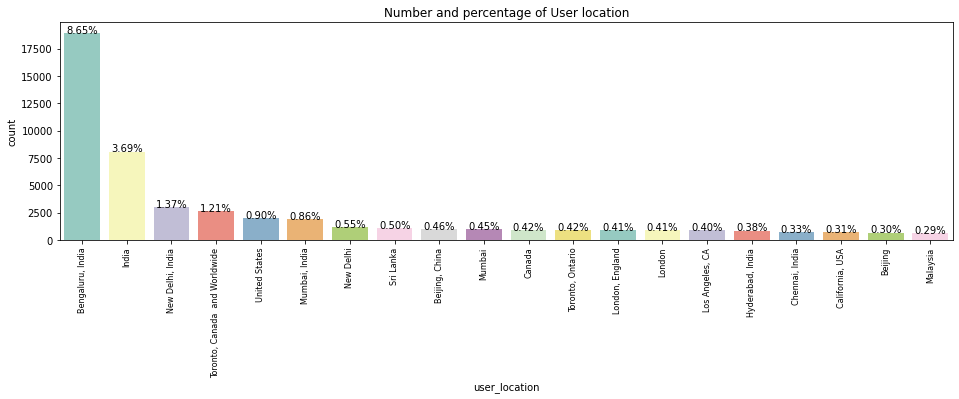

In [39]:
plot_count("user_location", "User location", df_vacc_tweet,4)

## Tweet Source

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



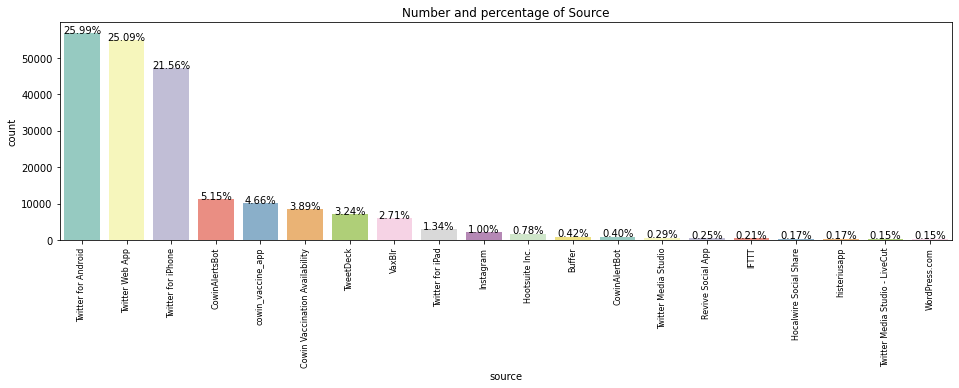

In [40]:
plot_count("source", "Source", df_vacc_tweet,4)

## Visulizing Tweet Count vs Location

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text major ticklabel objects>)

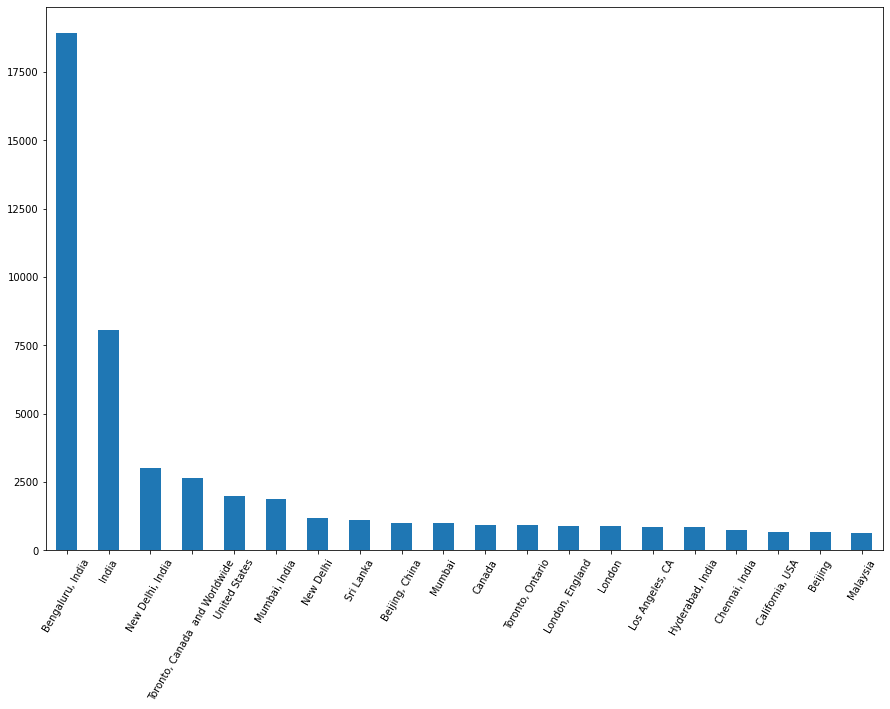

In [41]:
  
plt.figure(figsize=(15,10))
df_vacc_tweet['user_location'].value_counts().nlargest(20).plot(kind='bar')
plt.xticks(rotation=60)

## Text WordClouds

In [42]:
stopwords = set(STOPWORDS)

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=50,
        max_font_size=40, 
        scale=5,
        random_state=1
    ).generate(str(data))

    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

In [43]:
from wordcloud import WordCloud, STOPWORDS
def show_wordcloud(data, title=""):
    text = " ".join(t for t in data.dropna())
    stopwords = set(STOPWORDS)
    stopwords.update(["t", "co", "https", "amp", "U"])
    wordcloud = WordCloud(stopwords=stopwords, scale=4, max_font_size=50, max_words=500,background_color="black").generate(text)
    fig = plt.figure(1, figsize=(16,16))
    plt.axis('off')
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    plt.imshow(wordcloud, interpolation='bilinear')

In [44]:
df_vacc_tweet['user_location'].unique()

array(['La Crescenta-Montrose, CA', 'San Francisco, CA', 'Your Bed', ...,
       'Camarunggayan, Aurora Isabela', 'San Carlos,Cojedes,Venezuela',
       'Laoag City'], dtype=object)

### Prevalent words in tweets

#### 1. All

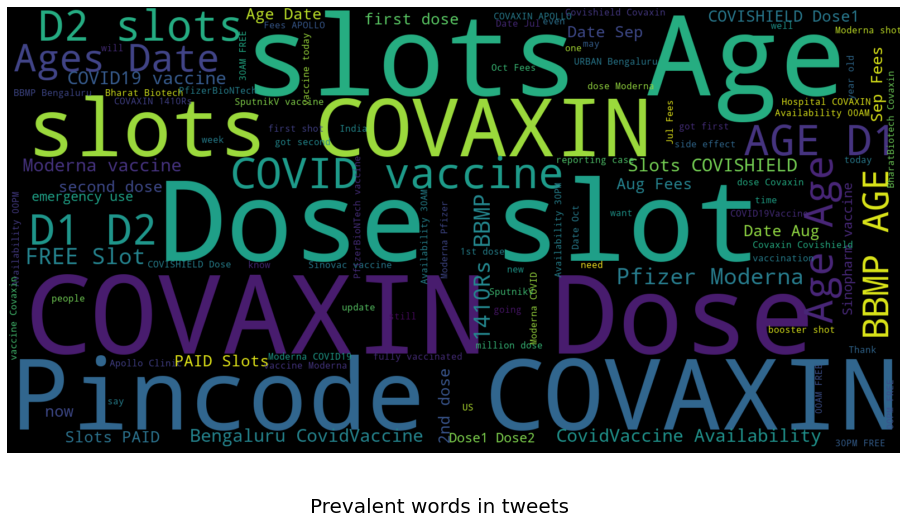

In [45]:
show_wordcloud(df_vacc_tweet['text'], title = 'Prevalent words in tweets')

#### 2. USA

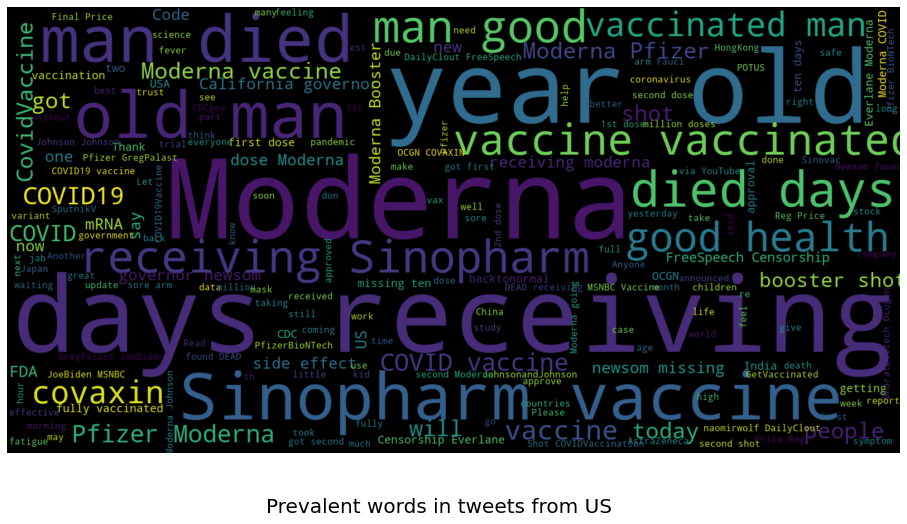

In [46]:
us_df = df_vacc_tweet.loc[df_vacc_tweet.user_location=="United States"]
show_wordcloud(us_df['text'], title = 'Prevalent words in tweets from US')

#### 3. California

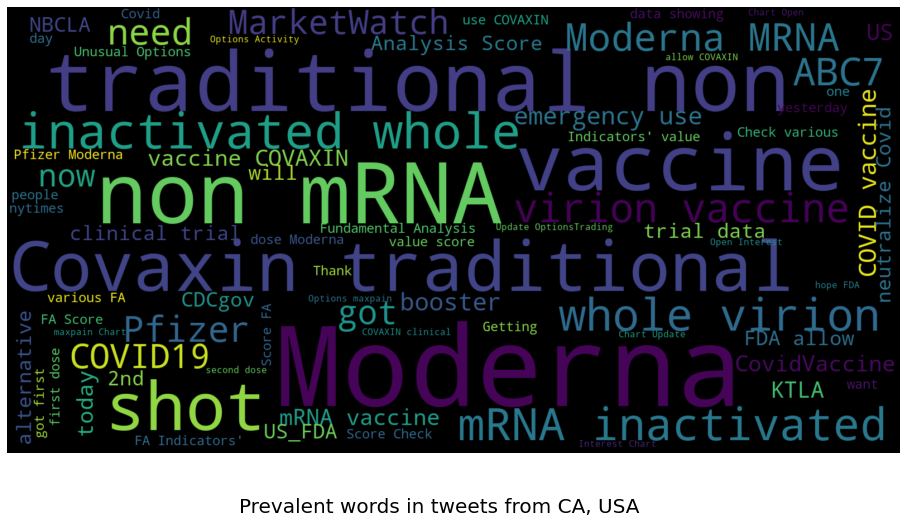

In [47]:
ca_df = df_vacc_tweet.loc[df_vacc_tweet.user_location=="California, USA"]
show_wordcloud(ca_df['text'], title = 'Prevalent words in tweets from CA, USA')

#### 4. UK

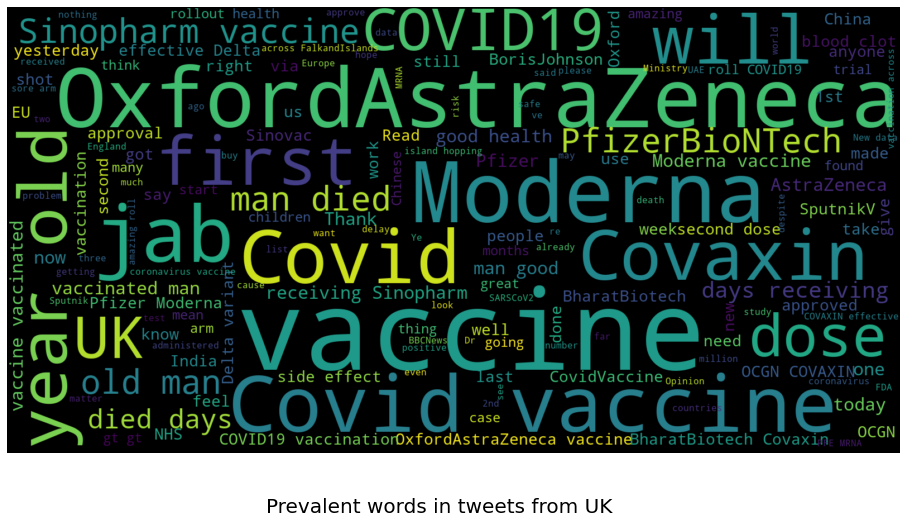

In [48]:
uk_df = df_vacc_tweet.loc[df_vacc_tweet.user_location=="United Kingdom"]
show_wordcloud(uk_df['text'], title = 'Prevalent words in tweets from UK')

#### 5. Canada

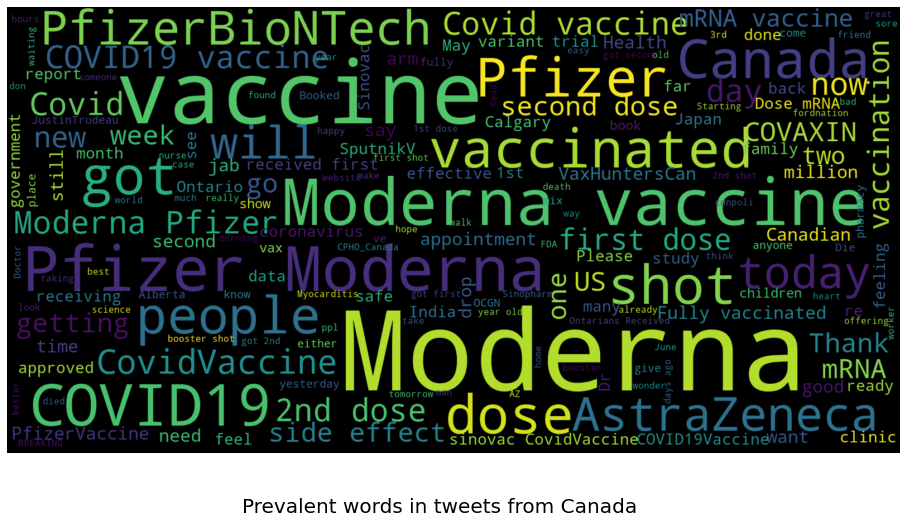

In [49]:
ca_df = df_vacc_tweet.loc[df_vacc_tweet.user_location=="Canada"]
show_wordcloud(ca_df['text'], title = 'Prevalent words in tweets from Canada')

#### 6. India

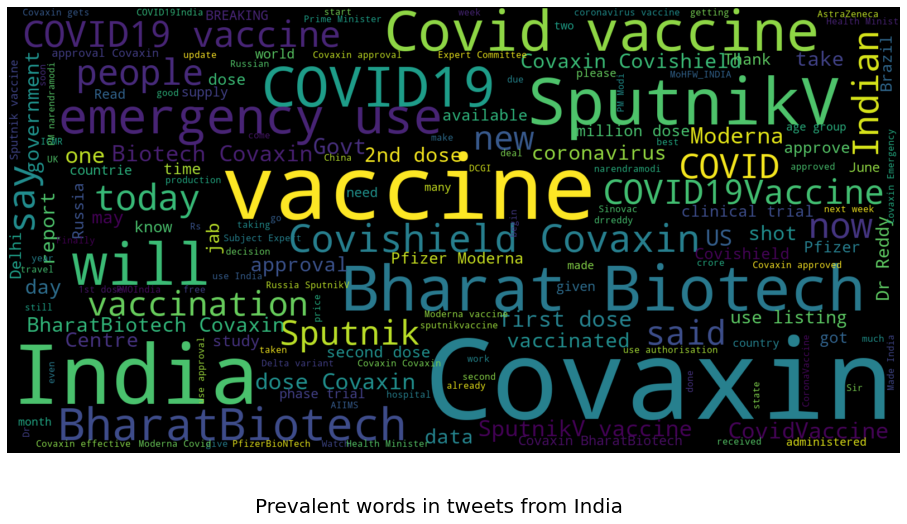

In [50]:
india_df = df_vacc_tweet.loc[df_vacc_tweet.user_location=="India"]
show_wordcloud(india_df['text'], title = 'Prevalent words in tweets from India')

#### 7. Bangladesh

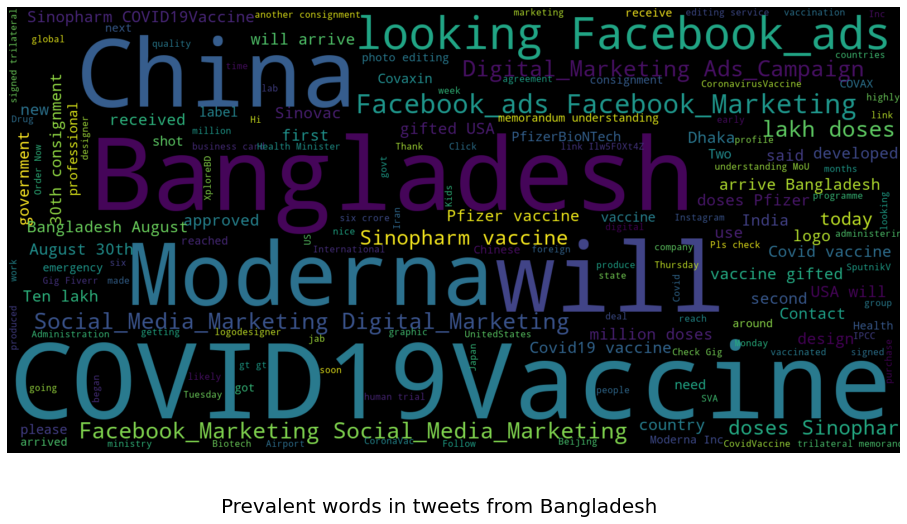

In [51]:
bd_df = df_vacc_tweet.loc[df_vacc_tweet.user_location=="Bangladesh"]
show_wordcloud(bd_df['text'], title = 'Prevalent words in tweets from Bangladesh')

# Hashtag Analysis

In [52]:
def plot_features_distribution(features, title, df, isLog=False):
    plt.figure(figsize=(12,6))
    plt.title(title)
    for feature in features:
        if(isLog):
            sns.distplot(np.log1p(df[feature]),kde=True,hist=False, bins=120, label=feature)
        else:
            sns.distplot(df[feature],kde=True,hist=False, bins=120, label=feature)
    plt.xlabel('')
    plt.legend()
    plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).



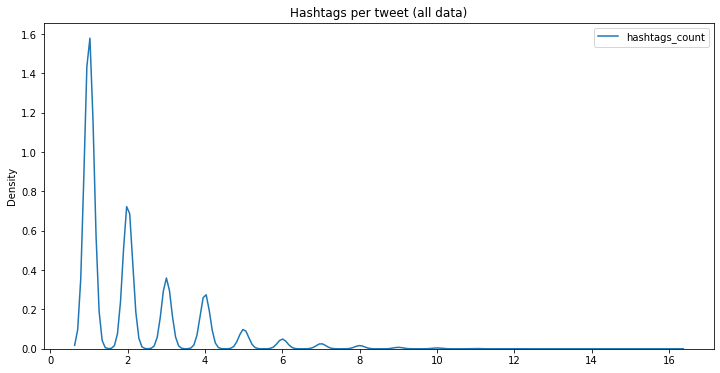

In [53]:
df_vacc_tweet['hashtags'] = df_vacc_tweet['hashtags'].replace(np.nan, "['None']", regex=True)
df_vacc_tweet['hashtags'] = df_vacc_tweet['hashtags'].apply(lambda x: x.replace('\\N',''))
df_vacc_tweet['hashtags_count'] = df_vacc_tweet['hashtags'].apply(lambda x: len(x.split(',')))
plot_features_distribution(['hashtags_count'], 'Hashtags per tweet (all data)', df_vacc_tweet)

In [54]:
df_vacc_tweet['hashtags_individual'] = df_vacc_tweet['hashtags'].apply(lambda x: x.split(','))
from itertools import chain
all_hashtags = set(chain.from_iterable(list(df_vacc_tweet['hashtags_individual'])))
print(f"There are totally: {len(all_hashtags)}")

There are totally: 41700


In [55]:
df_vacc_tweet['hashtags_individual'].head()

0                                                                          [['PfizerBioNTech']]
1                                                                                    [['None']]
2    [['coronavirus',  'SputnikV',  'AstraZeneca',  'PfizerBioNTech',  'Moderna',  'Covid_19']]
3                                                                                    [['None']]
4                                             [['whereareallthesickpeople',  'PfizerBioNTech']]
Name: hashtags_individual, dtype: object

# Date and Time Feature Analysis

- Time Variation

In [56]:
tweets_df = df_vacc_tweet
tweets_df['datedt'] = pd.to_datetime(tweets_df['date'])

In [57]:
tweets_df['year'] = tweets_df['datedt'].dt.year
tweets_df['month'] = tweets_df['datedt'].dt.month
tweets_df['day'] = tweets_df['datedt'].dt.day
tweets_df['dayofweek'] = tweets_df['datedt'].dt.dayofweek
tweets_df['hour'] = tweets_df['datedt'].dt.hour
tweets_df['minute'] = tweets_df['datedt'].dt.minute
tweets_df['dayofyear'] = tweets_df['datedt'].dt.dayofyear
tweets_df['date_only'] = tweets_df['datedt'].dt.date

In [58]:
tweets_agg_df = tweets_df.groupby(["date_only"])["text"].count().reset_index()
tweets_agg_df.columns = ["date_only", "count"]

In [59]:
def plot_time_variation(df, x='date_only', y='count', hue=None, size=1, title="", is_log=False):
    f, ax = plt.subplots(1,1, figsize=(4*size,3*size))
    g = sns.lineplot(x=x, y=y, hue=hue, data=df)
    plt.xticks(rotation=90)
    if hue:
        plt.title(f'{y} grouped by {hue} | {title}')
    else:
        plt.title(f'{y} | {title}')
    if(is_log):
        ax.set(yscale="log")
    ax.grid(color='black', linestyle='dotted', linewidth=0.75)
    plt.show() 

## Plot: Number of tweets / day of year

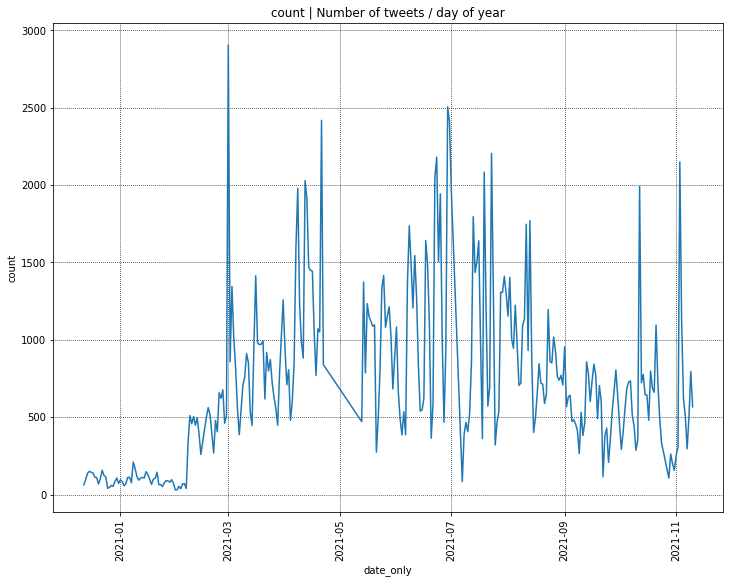

In [60]:
plot_time_variation(tweets_agg_df, title="Number of tweets / day of year",size=3)

## Pkot: Tweets / day of week

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



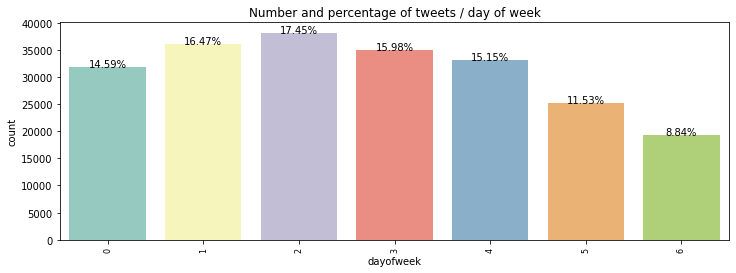

In [61]:
plot_count("dayofweek", "tweets / day of week", tweets_df, size=3, ordered=False)

## Plot: Tweets / day of year

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



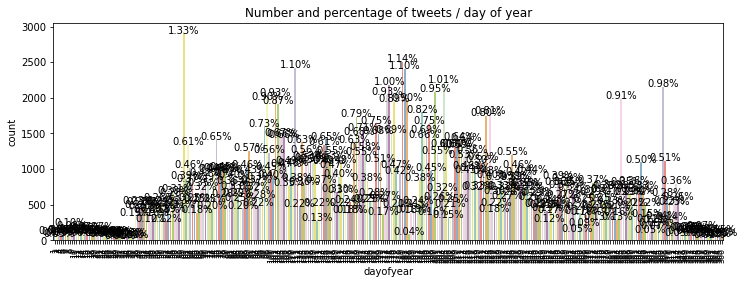

In [62]:
plot_count("dayofyear", "tweets / day of year", tweets_df, size=3, ordered=False)

## Plot: Tweet/ Date

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



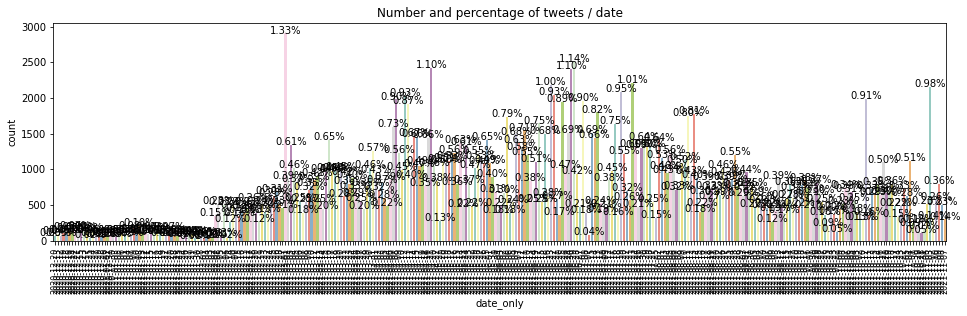

In [63]:
plot_count("date_only", "tweets / date", tweets_df,size=4, ordered=False)

## PLot: tweets / hour

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



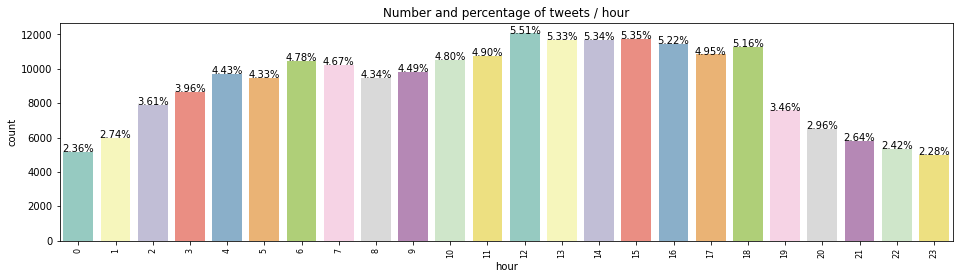

In [64]:
plot_count("hour", "tweets / hour", tweets_df,size=4, ordered=False)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



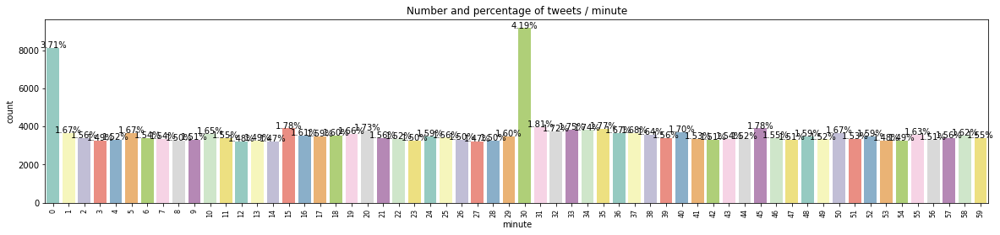

In [65]:
plot_count("minute", "tweets / minute", tweets_df,size=5, ordered=False)

# Opinon and Sentiment Analysis

In [66]:
stopwords = set(STOPWORDS)
def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        stopwords=stopwords,
        max_words=50,
        max_font_size=40, 
        scale=5,
        random_state=1
    ).generate(str(data))

    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

In [67]:
# tweets_df = df_vacc_tweet
tweets_df.head(3)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA","Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20,1,[['PfizerBioNTech']],2020-12-20 06:06:44,2020,12,20,6,6,6,355,2020-12-20
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccination effort we've ev… https://t.co/dlCHrZjkhm",['None'],Twitter Web App,1,1,False\r,2020-12-13,1,[['None']],2020-12-13 16:27:13,2020,12,13,6,16,27,348,2020-12-13
2,1337858199140118533,eli🇱🇹🇪🇺👌,Your Bed,"heil, hydra 🖐☺",2020-06-25 23:30:28,10,88,155,False,2020-12-12 20:33:45,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is created to last 2-4 years… https://t.co/ieYlCKBr8P,"['coronavirus', 'SputnikV', 'AstraZeneca', 'PfizerBioNTech', 'Moderna', 'Covid_19']",Twitter for Android,0,0,False\r,2020-12-12,6,"[['coronavirus', 'SputnikV', 'AstraZeneca', 'PfizerBioNTech', 'Moderna', 'Covid_19']]",2020-12-12 20:33:45,2020,12,12,5,20,33,347,2020-12-12


## 1. Sentiment Analysis : NLTK VADER

In [68]:
from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

In [69]:
# borrowed from https://www.kaggle.com/pashupatigupta/sentiments-transformer-vader-embedding-bert
# sia = SentimentIntensityAnalyzer()
def find_sentiment_score(post):
    return sia.polarity_scores(post)["compound"] 

In [70]:
def find_sentiment(post):
    if sia.polarity_scores(post)["compound"] > 0:
        return "Positive"
    elif sia.polarity_scores(post)["compound"] < 0:
        return "Negative"
    else:
        return "Neutral" 

In [71]:
def plot_sentiment(df, feature, title):
    counts = df[feature].value_counts()
    percent = counts/sum(counts)

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

    counts.plot(kind='bar', ax=ax1, color='green')
    percent.plot(kind='bar', ax=ax2, color='blue')
    ax1.set_ylabel(f'Counts : {title} sentiments', size=12)
    ax2.set_ylabel(f'Percentage : {title} sentiments', size=12)
    plt.suptitle(f"Sentiment analysis: {title}")
    plt.tight_layout()
    plt.show()

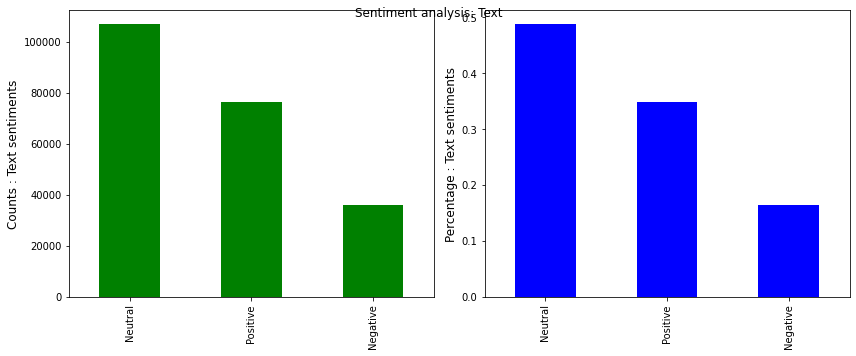

In [72]:
tweets_df['sentiment_score'] = tweets_df['text'].apply(lambda x: find_sentiment_score(x))
tweets_df['sentiment_vaber'] = tweets_df['text'].apply(lambda x: find_sentiment(x))
plot_sentiment(tweets_df, 'sentiment_vaber', 'Text')

### Positive Sentiment

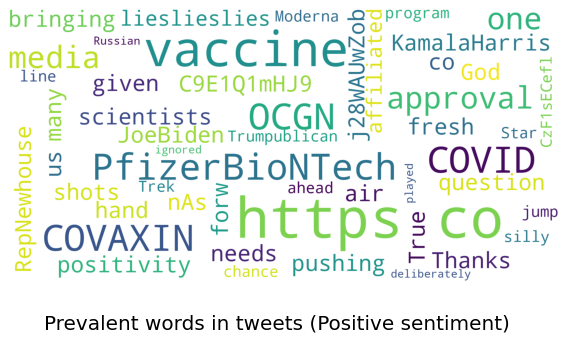

In [73]:
us_df = tweets_df.loc[tweets_df.user_location=="United States"]
show_wordcloud(us_df.loc[us_df['sentiment_vaber']=='Positive', 'text'], title = 'Prevalent words in tweets (Positive sentiment)')

### Negative Sentiment

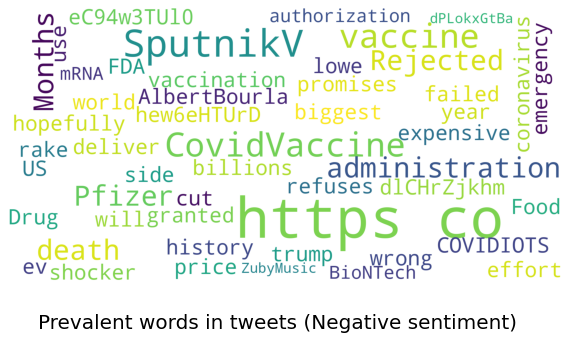

In [74]:
show_wordcloud(tweets_df.loc[tweets_df['sentiment_vaber']=='Negative', 'text'], title = 'Prevalent words in tweets (Negative sentiment)')

### Neutral Sentiment

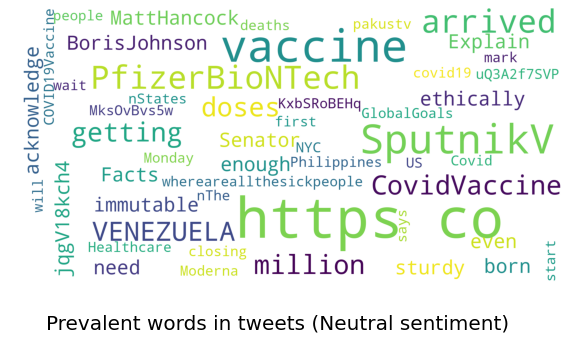

In [75]:
show_wordcloud(tweets_df.loc[tweets_df['sentiment_vaber']=='Neutral', 'text'], title = 'Prevalent words in tweets (Neutral sentiment)')

# Assigning Polarity & Subjectivity to tweets: TextBlob

In [76]:
tweets_df.columns

Index(['id', 'user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'retweets', 'favorites',
       'is_retweet\r', 'date_new', 'hashtags_count', 'hashtags_individual',
       'datedt', 'year', 'month', 'day', 'dayofweek', 'hour', 'minute',
       'dayofyear', 'date_only', 'sentiment_score', 'sentiment_vaber'],
      dtype='object')

In [77]:
tweets_df.head(2)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only,sentiment_score,sentiment_vaber
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA","Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20,1,[['PfizerBioNTech']],2020-12-20 06:06:44,2020,12,20,6,6,6,355,2020-12-20,0.4019,Positive
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccination effort we've ev… https://t.co/dlCHrZjkhm",['None'],Twitter Web App,1,1,False\r,2020-12-13,1,[['None']],2020-12-13 16:27:13,2020,12,13,6,16,27,348,2020-12-13,-0.1027,Negative


In [78]:
# Cleaning the data using neattext library
tweets_df['clean_data']=tweets_df['text'].apply(ntx.remove_hashtags)
tweets_df['clean_data']=tweets_df['clean_data'].apply(ntx.remove_urls)
tweets_df['clean_data']=tweets_df['clean_data'].apply(ntx.remove_userhandles)
tweets_df['clean_data']=tweets_df['clean_data'].apply(ntx.remove_multiple_spaces)
tweets_df['clean_data']=tweets_df['clean_data'].apply(ntx.remove_special_characters)

In [79]:
tweets_df[['clean_data','text']].head()

,clean_data,text
0,Same folks said daikon paste could treat a cytokine storm,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF
1,While the world has been on the wrong side of history this year hopefully the biggest vaccination effort weve ev,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccination effort we've ev… https://t.co/dlCHrZjkhm"
2,Russian vaccine is created to last 24 years,#coronavirus #SputnikV #AstraZeneca #PfizerBioNTech #Moderna #Covid_19 Russian vaccine is created to last 2-4 years… https://t.co/ieYlCKBr8P
3,Facts are immutable Senator even when youre not ethically sturdy enough to acknowledge them 1 You were born i,"Facts are immutable, Senator, even when you're not ethically sturdy enough to acknowledge them. (1) You were born i… https://t.co/jqgV18kch4"
4,Explain to me again why we need a vaccine,Explain to me again why we need a vaccine @BorisJohnson @MattHancock #whereareallthesickpeople #PfizerBioNTech… https://t.co/KxbSRoBEHq


In [80]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

lemmatizer = WordNetLemmatizer()
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [81]:
#stopwords are the words which won't bring about any changes to the polarity of the tweet
stop_words = stopwords.words('english')   
len(stop_words),stop_words[5:10]

(179, ['our', 'ours', 'ourselves', 'you', "you're"])

In [82]:
# function to remove stopwords
def stopWords(tweet):
  clean_tweet = tweet
  clean_tweet = " ".join(word for word in clean_tweet.split() if word not in stop_words)
# clean_tweet = " ".join(lemmatizer.lemmatize(word) for word in clean_tweet.split())
  return clean_tweet

In [83]:
 tweets_df['clean_data'] = tweets_df['clean_data'].apply(lambda x: stopWords(x))

In [84]:
tweets_df.head(2)

,id,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only,sentiment_score,sentiment_vaber,clean_data
0,1340539111971516416,Rachel Roh,"La Crescenta-Montrose, CA","Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,Same folks said daikon paste could treat a cytokine storm #PfizerBioNTech https://t.co/xeHhIMg1kF,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20,1,[['PfizerBioNTech']],2020-12-20 06:06:44,2020,12,20,6,6,6,355,2020-12-20,0.4019,Positive,Same folks said daikon paste could treat cytokine storm
1,1338158543359250433,Albert Fong,"San Francisco, CA","Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,"While the world has been on the wrong side of history this year, hopefully, the biggest vaccination effort we've ev… https://t.co/dlCHrZjkhm",['None'],Twitter Web App,1,1,False\r,2020-12-13,1,[['None']],2020-12-13 16:27:13,2020,12,13,6,16,27,348,2020-12-13,-0.1027,Negative,While world wrong side history year hopefully biggest vaccination effort weve ev


In [85]:
tweets_df.to_csv('./vaccine_tweets_cleans.csv', index=False)

In [86]:
from textblob import TextBlob
# Function to assign polarity and subjectivity to the tweets
def blob_fun(text):
  senti = TextBlob(text)
  senti_polarity = senti.sentiment.polarity
  senti_subjectivity = senti.sentiment.subjectivity

  if senti_polarity > 0:
    res = 'Positive'

  elif senti_polarity < 0:
    res = 'Negative'

  elif senti_polarity == 0:
    res ="Neutral"

  result = {'polarity':senti_polarity,'subjectivity':senti_subjectivity,'sentiment':res}

  return result

In [87]:
blob_fun(tweets_df['clean_data'][5])

{'polarity': 0.4, 'sentiment': 'Positive', 'subjectivity': 0.25}

In [88]:
# but this isn't always right as shown in the example below
blob_fun('thank god,i tested negative for covid')

{'polarity': -0.3, 'sentiment': 'Negative', 'subjectivity': 0.4}

In [89]:
tweets_df['results'] = tweets_df['clean_data'].apply(blob_fun)

In [90]:
tweets_df.drop(columns={"user_location",'text'},inplace=True)

In [91]:
tweets_df.head(2)

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only,sentiment_score,sentiment_vaber,clean_data,results
0,1340539111971516416,Rachel Roh,"Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20,1,[['PfizerBioNTech']],2020-12-20 06:06:44,2020,12,20,6,6,6,355,2020-12-20,0.4019,Positive,Same folks said daikon paste could treat cytokine storm,"{'polarity': 0.0, 'subjectivity': 0.125, 'sentiment': 'Neutral'}"
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,['None'],Twitter Web App,1,1,False\r,2020-12-13,1,[['None']],2020-12-13 16:27:13,2020,12,13,6,16,27,348,2020-12-13,-0.1027,Negative,While world wrong side history year hopefully biggest vaccination effort weve ev,"{'polarity': -0.5, 'subjectivity': 0.9, 'sentiment': 'Negative'}"


In [92]:
tweets_df = tweets_df.join(pd.json_normalize(data=tweets_df['results']))

In [93]:
tweets_df.head(2)

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only,sentiment_score,sentiment_vaber,clean_data,results,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,"Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20,1,[['PfizerBioNTech']],2020-12-20 06:06:44,2020,12,20,6,6,6,355,2020-12-20,0.4019,Positive,Same folks said daikon paste could treat cytokine storm,"{'polarity': 0.0, 'subjectivity': 0.125, 'sentiment': 'Neutral'}",0.0,0.125,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,['None'],Twitter Web App,1,1,False\r,2020-12-13,1,[['None']],2020-12-13 16:27:13,2020,12,13,6,16,27,348,2020-12-13,-0.1027,Negative,While world wrong side history year hopefully biggest vaccination effort weve ev,"{'polarity': -0.5, 'subjectivity': 0.9, 'sentiment': 'Negative'}",-0.5,0.900,Negative


In [94]:
# categorized tweets in seperate Series
positive_tweet =  tweets_df[tweets_df['sentiment'] == 'Positive']['clean_data']
negative_tweet =  tweets_df[tweets_df['sentiment'] == 'Negative']['clean_data']
neutral_tweet =  tweets_df[tweets_df['sentiment'] == 'Neutral']['clean_data']

In [95]:
from wordcloud import WordCloud
# Function for creating WordClouds
def cloud_of_Words(tweet_cat,title):
    forcloud = ' '.join([tweet for tweet in tweet_cat])
    wordcloud = WordCloud(width =500,height = 300,random_state =5,max_font_size=110).generate(forcloud)
    plt.imshow(wordcloud, interpolation ='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()
    plt.figure(figsize = (10,8))

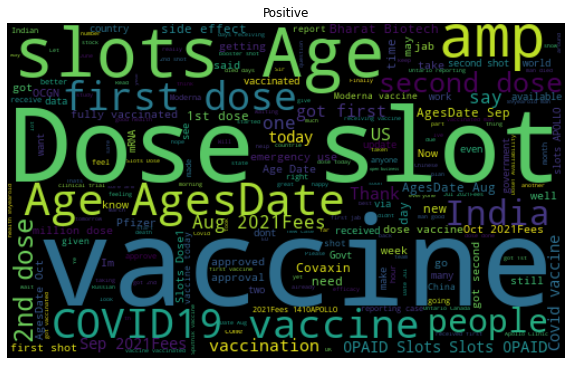

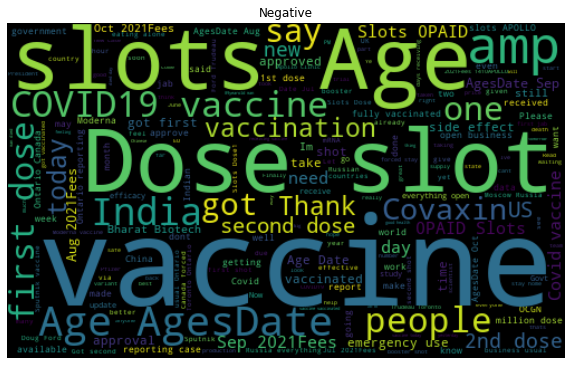

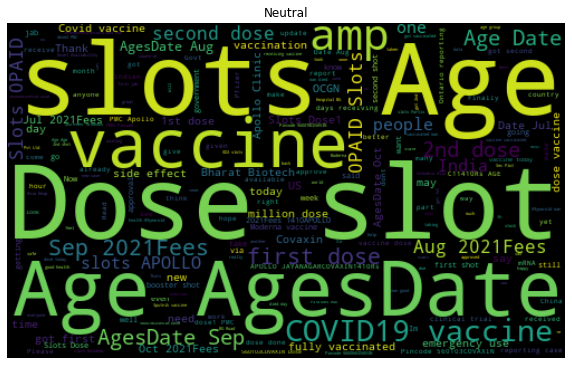

<Figure size 720x576 with 0 Axes>

In [96]:
plt.figure(figsize = (10,8))
# Creating wordclouds for positive, negative, neutral tweets
cloud_of_Words(positive_tweet, 'Positive')
cloud_of_Words(negative_tweet, 'Negative')
cloud_of_Words(neutral_tweet, 'Neutral')

In [97]:
#The above three wordclouds have the similar words as expected because our main analysis is Covid Vaccine

# Breaking down the tweets into words in seperate categories
positive_tokens = [token for line in positive_tweet for token in line.split()]
negative_tokens = [token for line in negative_tweet for token in line.split()]
neutral_tokens = [token for line in neutral_tweet for token in line.split()]

In [98]:
from collections import Counter
# to get most used words
def get_maxtoken(tweets,num=30):
  word_tokens = Counter(tweets)
  max_common = word_tokens.most_common(num)
  return dict(max_common)

In [99]:
def token_df_vis(x, title):
  df = pd.DataFrame(get_maxtoken(x).items(),columns=['words','count'])
  # plt.figure(figsize = (20,5))
  # plt.title(title)
  # plt.xticks(rotation=45)
  fig = px.bar(df,x='words',y='count',title = title)
  fig.show()

In [100]:
token_df_vis(positive_tokens,'Positive')
token_df_vis(negative_tokens,'Negative')
token_df_vis(neutral_tokens,'Neutral')

## the spread of our tweets on polarity vs subjectivity

In [101]:
fig = px.scatter(tweets_df,x='polarity',y='subjectivity')
fig.show()

# Vaccine wise Analysis

In [102]:
deep = tweets_df.drop(columns="results")
deep.head(2)

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only,sentiment_score,sentiment_vaber,clean_data,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,"Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20,1,[['PfizerBioNTech']],2020-12-20 06:06:44,2020,12,20,6,6,6,355,2020-12-20,0.4019,Positive,Same folks said daikon paste could treat cytokine storm,0.0,0.125,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,['None'],Twitter Web App,1,1,False\r,2020-12-13,1,[['None']],2020-12-13 16:27:13,2020,12,13,6,16,27,348,2020-12-13,-0.1027,Negative,While world wrong side history year hopefully biggest vaccination effort weve ev,-0.5,0.900,Negative


## Reference Tag for 5 Vaccines

In [103]:
# creating reference tags for 5 vaccines -> Pfizer, Covaxin(Bharat Biotech), Sputnik,AstraZenca(Covishield),Moderna
pfizer_refs = ["Pfizer","pfizer","Pfizer–BioNTech","pfizer-bioNtech","BioNTech","biontech"]
bbiotech_refs = ["covax","covaxin","Covax","Covaxin","Bharat Biotech","bharat biotech","BharatBiotech","bharatbiotech"]
sputnik_refs = ["russia","sputnik","Sputnik","V"]
astra_refs = ['sii','SII','adar poonawalla','Covishield','covishield','astra','zenca','Oxford–AstraZeneca','astrazenca','oxford-astrazenca','serum institiute']
moderna_refs = ['moderna','Moderna','mRNA-1273','Spikevax']

In [104]:
def refer(tweet, refs):
  flag =0
  for ref in refs:
    if tweet.find(ref) != -1:
      flag =1
  return flag

deep['pfizer'] = deep['clean_data'].apply(lambda x : refer(x, pfizer_refs))
deep['bbiotech'] = deep['clean_data'].apply(lambda x : refer(x, bbiotech_refs))
deep['sputnik'] = deep['clean_data'].apply(lambda x : refer(x, sputnik_refs))
deep['astra'] = deep['clean_data'].apply(lambda x : refer(x, astra_refs))
deep['moderna'] = deep['clean_data'].apply(lambda x : refer(x, moderna_refs))

In [105]:
display(deep.pfizer.value_counts(),deep.bbiotech.value_counts(),deep.sputnik.value_counts(),deep.astra.value_counts(),deep.moderna.value_counts())

0    215590
1      3441
Name: pfizer, dtype: int64

0    211931
1      7100
Name: bbiotech, dtype: int64

0    173681
1     45350
Name: sputnik, dtype: int64

0    217993
1      1038
Name: astra, dtype: int64

0    212502
1      6529
Name: moderna, dtype: int64

In [106]:
deep[deep['pfizer']==1].head(2)    #what the dataset looks like

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only,sentiment_score,sentiment_vaber,clean_data,polarity,subjectivity,sentiment,pfizer,bbiotech,sputnik,astra,moderna
23,1337773751841144833,BOOM Live,"IFCN certified fact-driven journalism. India's first independent online resource to fight misinformation, explain issues and keep the internet safe",2014-03-16 03:52:50,64185,1183,1794,True,2020-12-12 14:58:11,['None'],Twitter Web App,1,5,False\r,2020-12-12,1,[['None']],2020-12-12 14:58:11,2020,12,12,5,14,58,347,2020-12-12,-0.1531,Negative,The US Food Drug Administration FDA granted emergency use authorization PfizerBioNTechs mRNA,0.0,0.000000,Neutral,1,0,0,0,0
66,1338592427041579008,H24,"Go for breaking news and find what’s happening in the world experts,live and opinions.",2020-06-19 23:58:38,403,22,3001,False,2020-12-14 21:11:19,['None'],Twitter Media Studio,3,3,False\r,2020-12-14,1,[['None']],2020-12-14 21:11:19,2020,12,14,0,21,11,349,2020-12-14,0.0000,Neutral,ICU nurse Sandra Lindsay said proud becoming one first Americans receive Pfizer,0.5,0.727778,Positive,1,0,0,0,0


## MonthWise Vaccine Analysis

In [107]:
def vaccineMonthwiseAnalysis(vac_type,mon_num):
  df_v = deep[deep[vac_type]==1][['month','sentiment']]
  df_vm = df_v.groupby(df_v['month'])['sentiment'].value_counts().reset_index(name='counts')
  df_vma = df_vm[df_vm['month']==mon_num]
  fig = px.bar(df_vma, x='sentiment', y='counts',color="sentiment")
  fig.show()
  return df_vma.head()

## Polarity and Subjectivity of Different Vaccines

In [108]:
def stats(a,b,c,d,e):
  for i in a,b,c,d,e:
     display(deep[deep[i]==1][[i,'polarity','subjectivity']].groupby(i).agg([np.mean,np.max,np.min,np.median]))

In [109]:
stats('pfizer','bbiotech','sputnik','astra','moderna')

polarity                  subjectivity                 
            mean amax amin median         mean amax amin median
pfizer                                                         
1       0.082555  1.0 -1.0    0.0     0.224971  1.0  0.0    0.0

polarity                  subjectivity                 
             mean amax amin median         mean amax amin median
bbiotech                                                        
1         0.07806  1.0 -1.0    0.0     0.217085  1.0  0.0    0.0

polarity                  subjectivity                 
            mean amax amin median         mean amax amin median
sputnik                                                        
1        0.07153  1.0 -1.0    0.0     0.211891  1.0  0.0    0.0

polarity                  subjectivity                 
           mean amax amin median         mean amax amin median
astra                                                         
1      0.078937  1.0 -1.0    0.0     0.223175  1.0  0.0    0.0

polarity                  subjectivity                 
             mean amax amin median         mean amax amin median
moderna                                                         
1        0.081109  1.0 -1.0    0.0     0.231455  1.0  0.0    0.0

In [110]:
pfizer = deep[deep['pfizer']==1][['date','polarity']]
bbiotech = deep[deep['bbiotech']==1][['date','polarity']]
sputnik = deep[deep['sputnik']==1][['date','polarity']]
astra = deep[deep['astra']==1][['date','polarity']]
moderna = deep[deep['moderna']==1][['date','polarity']]

pfizer = pfizer.sort_values(by='date',ascending=True)
bbiotech = bbiotech.sort_values(by='date',ascending=True)
sputnik = sputnik.sort_values(by='date',ascending=True)
astra = astra.sort_values(by='date',ascending=True)
moderna = moderna.sort_values(by='date',ascending=True)

pfizer['Avg Polarity'] = pfizer.polarity.rolling(20, min_periods=3).mean()
bbiotech['Avg Polarity'] = bbiotech.polarity.rolling(20, min_periods=3).mean()
sputnik['Avg Polarity'] = sputnik.polarity.rolling(20, min_periods=3).mean()
astra['Avg Polarity'] = astra.polarity.rolling(5, min_periods=3).mean()
moderna['Avg Polarity'] = moderna.polarity.rolling(20, min_periods=3).mean()

In [111]:
pfizer.head(5)

,date,polarity,Avg Polarity
23,2020-12-12 14:58:11,0.0,NaN
294,2020-12-12 22:17:46,0.0,NaN
292,2020-12-12 22:36:49,0.0,0.0
289,2020-12-12 23:13:56,0.0,0.0
271,2020-12-13 02:59:33,0.0,0.0


# Retweet Count Vs Polarity Over Timeline

In [ ]:
timeline = tweets_df.groupby(['date']).agg(np.nanmean).reset_index()
timeline['count'] = tweets_df.groupby(['date']).count().reset_index()['retweets']
timeline = timeline[['date', 'count', 'polarity', 'retweets', 'favorites', 'subjectivity']]
timeline["polarity"] = timeline["polarity"].astype(float)
timeline["subjectivity"] = timeline["subjectivity"].astype(float)
timeline.head(2)

In [ ]:
fig = px.line(timeline, x='date', y='count')
fig.show()

# Visualizing the vaccine Polarity (Moving Average) vs Time



In [114]:
tweets_df.head(2)

,id,user_name,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,hashtags,source,retweets,favorites,is_retweet\r,date_new,hashtags_count,hashtags_individual,datedt,year,month,day,dayofweek,hour,minute,dayofyear,date_only,sentiment_score,sentiment_vaber,clean_data,results,polarity,subjectivity,sentiment
0,1340539111971516416,Rachel Roh,"Aggregator of Asian American news; scanning diverse sources 24/7/365. RT's, Follows and 'Likes' will fuel me 👩‍💻",2009-04-08 17:52:46,405,1692,3247,False,2020-12-20 06:06:44,['PfizerBioNTech'],Twitter for Android,0,0,False\r,2020-12-20,1,[['PfizerBioNTech']],2020-12-20 06:06:44,2020,12,20,6,6,6,355,2020-12-20,0.4019,Positive,Same folks said daikon paste could treat cytokine storm,"{'polarity': 0.0, 'subjectivity': 0.125, 'sentiment': 'Neutral'}",0.0,0.125,Neutral
1,1338158543359250433,Albert Fong,"Marketing dude, tech geek, heavy metal & '80s music junkie. Fascinated by meteorology and all things in the cloud. Opinions are my own.",2009-09-21 15:27:30,834,666,178,False,2020-12-13 16:27:13,['None'],Twitter Web App,1,1,False\r,2020-12-13,1,[['None']],2020-12-13 16:27:13,2020,12,13,6,16,27,348,2020-12-13,-0.1027,Negative,While world wrong side history year hopefully biggest vaccination effort weve ev,"{'polarity': -0.5, 'subjectivity': 0.9, 'sentiment': 'Negative'}",-0.5,0.900,Negative


In [115]:
pfizer = deep[deep['pfizer']==1][['date','polarity']]
bbiotech = deep[deep['bbiotech']==1][['date','polarity']]
sputnik = deep[deep['sputnik']==1][['date','polarity']]
astra = deep[deep['astra']==1][['date','polarity']]
moderna = deep[deep['moderna']==1][['date','polarity']]

pfizer = pfizer.sort_values(by='date',ascending=True)
bbiotech = bbiotech.sort_values(by='date',ascending=True)
sputnik = sputnik.sort_values(by='date',ascending=True)
astra = astra.sort_values(by='date',ascending=True)
moderna = moderna.sort_values(by='date',ascending=True)

pfizer['Avg Polarity'] = pfizer.polarity.rolling(20, min_periods=3).mean()
bbiotech['Avg Polarity'] = bbiotech.polarity.rolling(20, min_periods=3).mean()
sputnik['Avg Polarity'] = sputnik.polarity.rolling(20, min_periods=3).mean()
astra['Avg Polarity'] = astra.polarity.rolling(5, min_periods=3).mean()
moderna['Avg Polarity'] = moderna.polarity.rolling(20, min_periods=3).mean()

In [116]:
fig = px.line(pfizer, x='date', y='polarity')
fig.show()

In [117]:
a,b,c,d,e = pfizer,bbiotech,sputnik,astra,moderna
fig = px.line(a, x="date", y="Avg Polarity", title='Pfizer')
fig.show()
fig = px.line(b, x="date", y="Avg Polarity", title='Bharat Biotech')
fig.show()
fig = px.line(c, x="date", y="Avg Polarity", title='Sputnik')
fig.show()
fig = px.line(d, x="date", y="Avg Polarity", title='AstraZence/Covishield')
fig.show()
fig = px.line(e, x="date", y="Avg Polarity", title='Moderna')
fig.show()

# Visualizing Complete and Average polarity for All Vaccines

In [118]:
import plotly.graph_objects as go

def plotPolarityGraph(vac_type):
  fig = go.Figure()
  fig.add_trace(
    go.Scatter(
        x=vac_type['date'],
        y=vac_type['polarity'],
        name = "Complete Polarity"
    ))
  fig.add_trace(
    go.Scatter(
        x=vac_type['date'],
        y=vac_type['Avg Polarity'],
        name = "Average Polarity"
    ))
  fig.show()

In [119]:
plotPolarityGraph(bbiotech)

# Visualizing month wise vaccine sentiment

In [120]:
vaccineMonthwiseAnalysis('sputnik',1)

,month,sentiment,counts
0,1,Positive,224
1,1,Neutral,210
2,1,Negative,43


# Plot for All 5 Vaccines

In [122]:
v1 = pd.DataFrame(deep['astra'].value_counts().reset_index(name='counts'))
v1 = v1[v1['index'] != 0]
v1['vaccine'] = 'astra'

v2 = pd.DataFrame(deep['bbiotech'].value_counts().reset_index(name='counts'))
v2 = v2[v2['index'] != 0]
v2['vaccine'] = 'bbiotech'

v3 = pd.DataFrame(deep['moderna'].value_counts().reset_index(name='counts'))
v3 = v3[v3['index'] != 0]
v3['vaccine'] = 'moderna'

v4 = pd.DataFrame(deep['pfizer'].value_counts().reset_index(name='counts'))
v4 = v4[v4['index'] != 0]
v4['vaccine'] = 'pfizer'

v5 = pd.DataFrame(deep['sputnik'].value_counts().reset_index(name='counts'))
v5 = v5[v5['index'] != 0]
v5['vaccine'] = 'sputnik'

frames = [v1, v2, v3, v4, v5]
result = pd.concat(frames)
result.head()

,index,counts,vaccine
1,1,1038,astra
1,1,7100,bbiotech
1,1,6529,moderna
1,1,3441,pfizer
1,1,45350,sputnik


In [123]:
data = {
   "values": result['counts'][:15],
   "labels": result['vaccine'],
   "domain": {"column": 0},
   "name": "Vaccine Name",
   "hoverinfo":"label+percent+name",
   "hole": .4,
   "type": "pie"
}
layout = go.Layout(title="<b>Ratio on Vaccine</b>", legend=dict(x=0.1, y=1.1, orientation="h"))

data = [data]
fig = go.Figure(data = data, layout = layout)
fig.update_layout(title_x=0.5)
fig.show()

# Visualizing Overall Vaccine Polarity

In [121]:
total=pd.DataFrame()
total['date'] = sorted(deep['date'].unique())
senti=list()
for date in total['date']:
    senti.append(deep[deep['date']==date].polarity.mean())
total['Sentiment']=senti
fig = px.line(total, x="date", y="Sentiment", title='Overall Sentiment around Vaccines')
fig.show() 

KeyboardInterrupt: ignored

# References  
* 1. https://www.kaggle.com/amartyanambiar/covid-19-vaccine-sentitmental-analysis/notebook (used upto line 15)
* 2. https://www.kaggle.com/gpreda/explore-vaccines-tweets#Data-preparation (up to before Sentiment analysis, but have to fix time distribution plots)
* 3. https://towardsdatascience.com/sentiment-analysis-of-covid-19-vaccine-tweets-dc6f41a5e1af
------------
2nd Dataset

1. https://www.kaggle.com/filterjoe/world-covid-19-vaccines-complex-visualizations
2. https://www.kaggle.com/aliderakhshesh/time-series-with-ml